<a href="https://colab.research.google.com/github/goshobhit123/AIMLProjects/blob/main/flickr_image_caption_with_pytorch_resnet_lstm_flickr8k(Group5).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# ==============================================================================
# 1. SETUP AND IMPORTS
# ==============================================================================
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as T
from torch.utils.data import DataLoader, Dataset
from torch.nn.utils.rnn import pad_sequence

import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import os
from collections import Counter
import spacy


In [ ]:
# Load the spacy model
# Note: You may need to run `!python -m spacy download en_core_web_sm` in a separate cell first
spacy_eng = spacy.load('en_core_web_sm')


In [ ]:
# ==============================================================================
# 2. CONFIGURATION AND DATA PATHS (MODIFIED)
# ==============================================================================
# MODIFICATION: Using the Google Drive path from our previous sessions.
# Ensure your Google Drive is mounted in Colab.
try:
    from google.colab import drive
    drive.mount('/content/drive')
    print("Google Drive mounted successfully.")
except ImportError:
    print("Not in a Colab environment. Using local paths.")

# Define the base path for the Flickr8k dataset on your Google Drive
base_flickr8k_path = '/content/drive/MyDrive/Multimodal-Media-Retrieval-Captioning/flickr8k'

# Construct the full paths to the images and captions file
image_data_location = os.path.join(base_flickr8k_path, 'Images')
caption_data_location = os.path.join(base_flickr8k_path, 'captions.txt')

print(f"Image directory path: {image_data_location}")
print(f"Captions file path: {caption_data_location}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted successfully.
Image directory path: /content/drive/MyDrive/Multimodal-Media-Retrieval-Captioning/flickr8k/Images
Captions file path: /content/drive/MyDrive/Multimodal-Media-Retrieval-Captioning/flickr8k/captions.txt


In [ ]:
# ==============================================================================
# 3. DATA LOADING AND VISUALIZATION (MODIFIED)
# ==============================================================================
# MODIFICATION: Reading the comma-separated captions.txt directly into a DataFrame.
# This part correctly loads the data as per your file's format.
try:
    df = pd.read_csv(caption_data_location, delimiter=',')
    # Ensure the columns are named correctly, stripping any whitespace
    df.columns = ['image', 'caption']
    print("Successfully loaded captions.txt as a CSV.")
    print("DataFrame head:")
    print(df.head())
except FileNotFoundError:
    print(f"ERROR: The file was not found at {caption_data_location}. Please check the path.")
except Exception as e:
    print(f"An error occurred while reading the CSV: {e}")


Successfully loaded captions.txt as a CSV.
DataFrame head:
                       image  \
0  1000268201_693b08cb0e.jpg   
1  1000268201_693b08cb0e.jpg   
2  1000268201_693b08cb0e.jpg   
3  1000268201_693b08cb0e.jpg   
4  1000268201_693b08cb0e.jpg   

                                             caption  
0  A child in a pink dress is climbing up a set o...  
1              A girl going into a wooden building .  
2   A little girl climbing into a wooden playhouse .  
3  A little girl climbing the stairs to her playh...  
4  A little girl in a pink dress going into a woo...  



--- Displaying a sample image and its captions ---


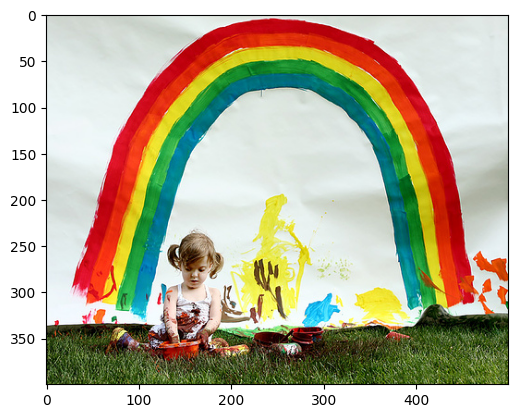

Caption - A little girl is sitting in front of a large painted rainbow .
Caption - A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it .
Caption - There is a girl with pigtails sitting in front of a rainbow painting .
Caption - Young girl with pigtails painting outside in the grass .
Caption - A man lays on a bench while his dog sits by him .
--------------------------------------------------



In [ ]:
# Display a sample image and its captions
print("\n--- Displaying a sample image and its captions ---")
data_idx = 11 # You can change this index to see different images
if 'df' in locals() and len(df) > data_idx + 5:
    image_path = os.path.join(image_data_location, df.iloc[data_idx, 0])
    try:
        img = mpimg.imread(image_path)
        plt.imshow(img)
        plt.show()

        for i in range(data_idx, data_idx + 5):
            print(f"Caption - {df.iloc[i,1]}")
    except FileNotFoundError:
        print(f"Sample image not found at: {image_path}")
else:
    print("DataFrame not loaded correctly, skipping sample display.")
print("--------------------------------------------------\n")


In [ ]:
# ==============================================================================
# 4. VOCABULARY AND DATASET CLASSES
# ==============================================================================
class Vocabulary:
    def __init__(self,freq_threshold):
        self.itos = {0:"<PAD>",1:"<SOS>",2:"<EOS>",3:"<UNK>"}
        self.stoi = {v:k for k,v in self.itos.items()}
        self.freq_threshold = freq_threshold

    def __len__(self):
        return len(self.itos)

    @staticmethod
    def tokenize(text):
        return [token.text.lower() for token in spacy_eng.tokenizer(text)]

    def build_vocab(self,sentence_list):
        frequencies = Counter()
        idx = 4
        for sentence in sentence_list:
            for word in self.tokenize(sentence):
                frequencies[word] += 1
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1

    def numericalize(self,text):
        tokenized_text = self.tokenize(text)
        return [self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_text]


class CustomDataset(Dataset):
    def __init__(self,root_dir,captions_file,transform=None, freq_threshold=5):
        self.root_dir = root_dir
        self.df = pd.read_csv(captions_file)
        self.transform = transform
        self.imgs = self.df["image"]
        self.captions = self.df["caption"]
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocab(self.captions.tolist())

    def __len__(self):
        return len(self.df)

    def __getitem__(self,idx):
        caption = self.captions[idx]
        img_name = self.imgs[idx]
        img_location = os.path.join(self.root_dir,img_name)

        try:
            img = Image.open(img_location).convert("RGB")
        except FileNotFoundError:
            print(f"Error: Image not found at {img_location}")
            # Return a placeholder tensor if image is not found
            return torch.zeros((3, 224, 224)), torch.tensor([0])


        if self.transform is not None:
            img = self.transform(img)

        caption_vec = []
        caption_vec += [self.vocab.stoi["<SOS>"]]
        caption_vec += self.vocab.numericalize(caption)
        caption_vec += [self.vocab.stoi["<EOS>"]]

        return img, torch.tensor(caption_vec)

# Defining the transform to be applied
transforms = T.Compose([
    T.Resize((224,224)),
    T.ToTensor()
])

In [ ]:
# Testing the dataset
print("Initializing and testing the CustomDataset...")
dataset = CustomDataset(
        root_dir = image_data_location,
        captions_file = caption_data_location,
        transform = transforms
)
print("Dataset initialized successfully.")

Initializing and testing the CustomDataset...
Dataset initialized successfully.


In [ ]:
# ==============================================================================
# 5. DATALOADER SETUP
# ==============================================================================
class CapsCollate:
    def __init__(self,pad_idx,batch_first=False):
        self.pad_idx = pad_idx
        self.batch_first = batch_first

    def __call__(self,batch):
        # Filter out any None items from the batch that may have resulted from file not found errors
        batch = [item for item in batch if item[0] is not None]
        if not batch:
            return None, None

        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs,dim=0)
        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=self.batch_first, padding_value=self.pad_idx)
        return imgs,targets

# Setting the constants
BATCH_SIZE = 32 # Increased batch size for better GPU utilization
NUM_WORKER = 2  # Standard for Colab

# Token to represent the padding
pad_idx = dataset.vocab.stoi["<PAD>"]

data_loader = DataLoader(
    dataset=dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
)
print("DataLoader created successfully.")


DataLoader created successfully.


In [ ]:
# ==============================================================================
# 6. MODEL DEFINITION (ResNet-50 Encoder + LSTM Decoder)
# ==============================================================================
class EncoderCNN(nn.Module):
    """
    Encoder model using a pre-trained ResNet-50 to extract image features.
    """
    def __init__(self,embed_size):
        super(EncoderCNN,self).__init__()
        resnet = models.resnet50(pretrained=True)
        # Freeze all layers in the pre-trained model
        for param in resnet.parameters():
            param.requires_grad_(False)

        modules = list(resnet.children())[:-1]
        self.resnet = nn.Sequential(*modules)
        self.embed = nn.Linear(resnet.fc.in_features,embed_size)

    def forward(self,images):
        features = self.resnet(images)
        features = features.view(features.size(0),-1)
        features = self.embed(features)
        return features

class DecoderRNN(nn.Module):
    """
    Decoder model using an LSTM network to generate captions from image features.
    """
    def __init__(self,embed_size,hidden_size,vocab_size,num_layers=1,drop_prob=0.3):
        super(DecoderRNN,self).__init__()
        self.embedding = nn.Embedding(vocab_size,embed_size)
        self.lstm = nn.LSTM(embed_size,hidden_size,num_layers=num_layers,batch_first=True)
        self.fcn = nn.Linear(hidden_size,vocab_size)
        self.drop = nn.Dropout(drop_prob)

    def forward(self,features, captions):
        embeds = self.embedding(captions[:,:-1]) # Exclude <EOS> token for input
        x = torch.cat((features.unsqueeze(1),embeds),dim=1)
        x,_ = self.lstm(x)
        x = self.fcn(x)
        return x

    def generate_caption(self,inputs,hidden=None,max_len=20,vocab=None):
        batch_size = inputs.size(0)
        captions_idx = []

        with torch.no_grad():
            for i in range(max_len):
                output, hidden = self.lstm(inputs, hidden)
                output = self.fcn(output.squeeze(1))
                predicted_word_idx = output.argmax(1)

                captions_idx.append(predicted_word_idx.item())

                if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                    break

                inputs = self.embedding(predicted_word_idx).unsqueeze(1)

        return [vocab.itos[idx] for idx in captions_idx]


class EncoderDecoder(nn.Module):
    def __init__(self,embed_size,hidden_size,vocab_size,num_layers=1,drop_prob=0.3):
        super(EncoderDecoder,self).__init__()
        self.encoder = EncoderCNN(embed_size)
        self.decoder = DecoderRNN(embed_size,hidden_size,vocab_size,num_layers,drop_prob)

    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs

print("Encoder-Decoder model (ResNet+LSTM) defined.")


Encoder-Decoder model (ResNet+LSTM) defined.


Training on device: cuda


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Starting training...
Epoch: 1/10, Step: 200/1265, Loss: 3.94273
Generated Caption: <SOS> a man in a dog in a <UNK> . <EOS>


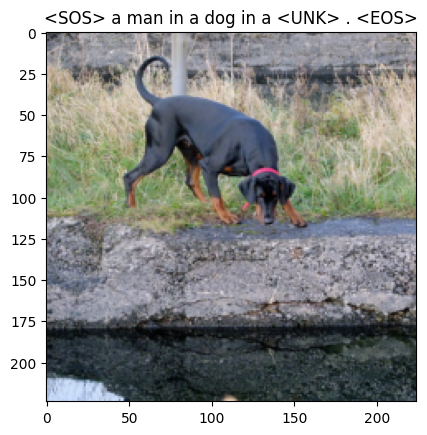

Epoch: 1/10, Step: 400/1265, Loss: 3.57992
Generated Caption: <SOS> a man in a white dog is in a red and white dog . <EOS>


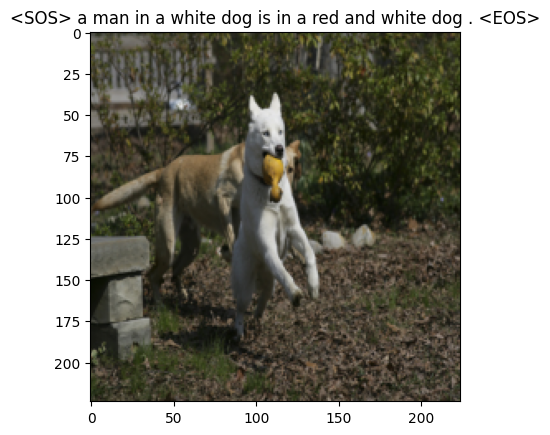

Epoch: 1/10, Step: 600/1265, Loss: 3.58283
Generated Caption: <SOS> a man in a blue shirt is running on a field . <EOS>


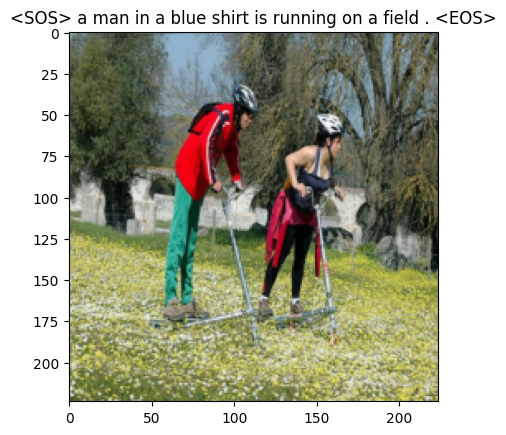

Epoch: 1/10, Step: 800/1265, Loss: 3.32367
Generated Caption: <SOS> a man in a blue shirt is running through the water . <EOS>


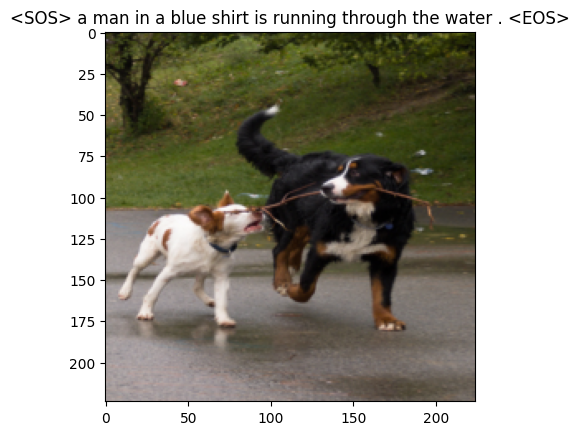

Epoch: 1/10, Step: 1000/1265, Loss: 3.33814
Generated Caption: <SOS> a man in a blue shirt is running on a field . <EOS>


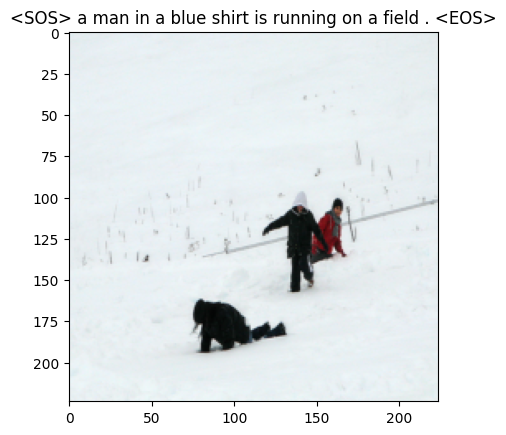

Epoch: 1/10, Step: 1200/1265, Loss: 2.89781
Generated Caption: <SOS> a man in a red shirt is jumping on a <UNK> . <EOS>


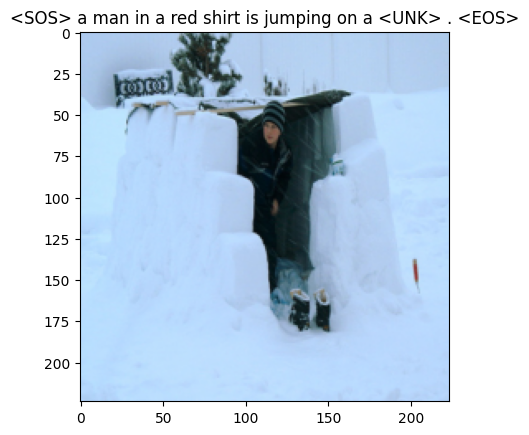

Epoch: 2/10, Step: 200/1265, Loss: 3.10287
Generated Caption: <SOS> a dog is running through the grass . <EOS>


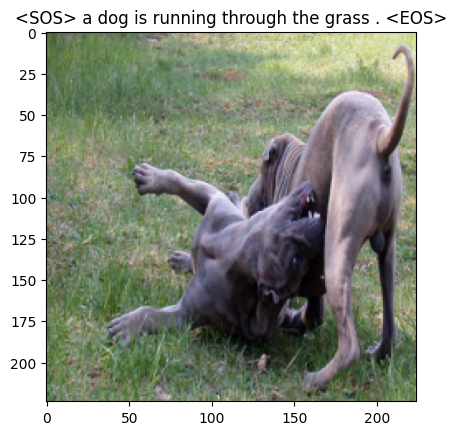

Epoch: 2/10, Step: 400/1265, Loss: 3.03861
Generated Caption: <SOS> a black dog is running through the grass . <EOS>


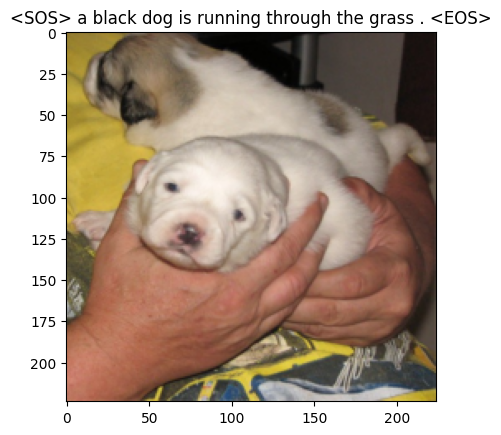

Epoch: 2/10, Step: 600/1265, Loss: 2.94720
Generated Caption: <SOS> a man in a blue shirt is standing on a bench . <EOS>


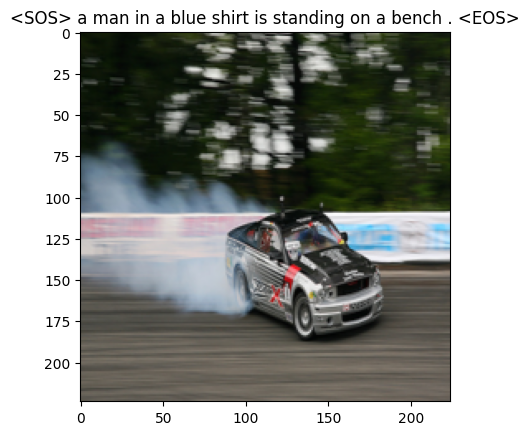

Epoch: 2/10, Step: 800/1265, Loss: 2.85751
Generated Caption: <SOS> a man in a blue shirt is standing on a bench . <EOS>


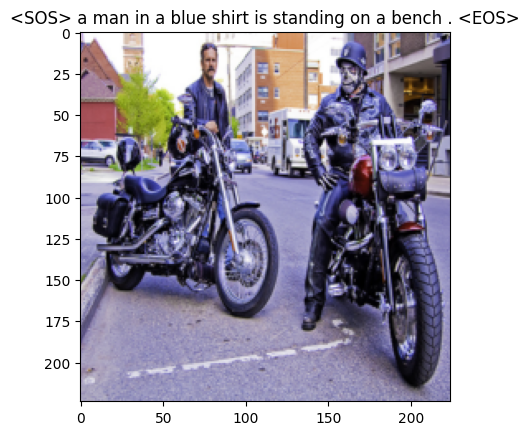

Epoch: 2/10, Step: 1000/1265, Loss: 2.79010
Generated Caption: <SOS> a man in a red shirt and a black shirt is sitting on a bench . <EOS>


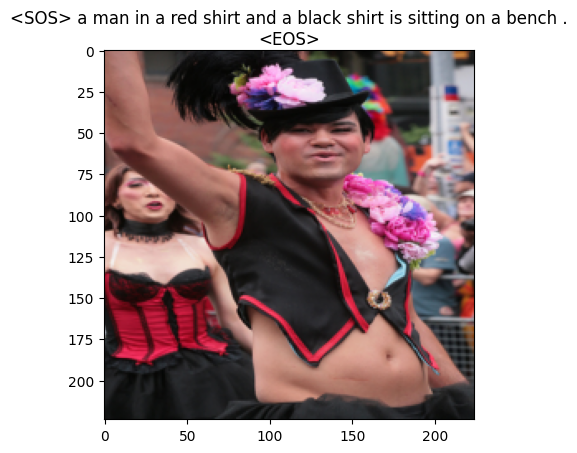

Epoch: 2/10, Step: 1200/1265, Loss: 3.23995
Generated Caption: <SOS> a young boy in a blue shirt and blue shorts is jumping over a large tree . <EOS>


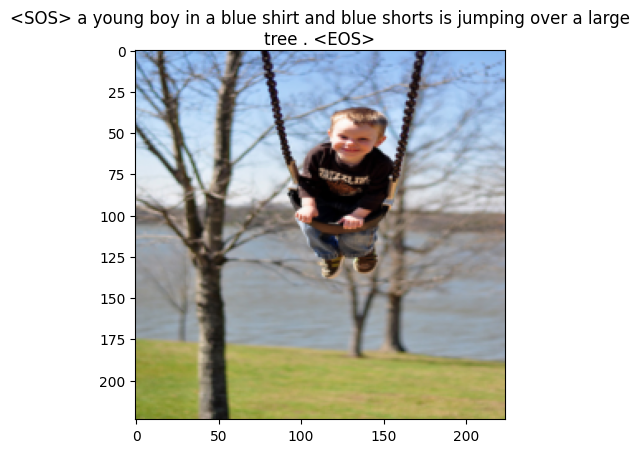

Epoch: 3/10, Step: 200/1265, Loss: 2.49510
Generated Caption: <SOS> a man in a red shirt and a black and white dog is standing on a sidewalk . <EOS>


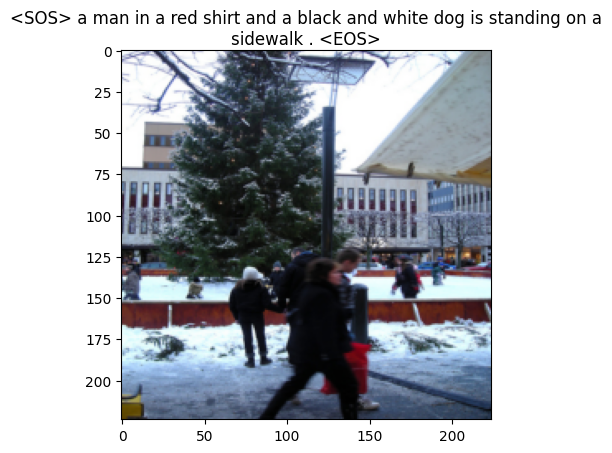

Epoch: 3/10, Step: 400/1265, Loss: 2.75603
Generated Caption: <SOS> a man in a red shirt and a woman in a white shirt and white pants and a white


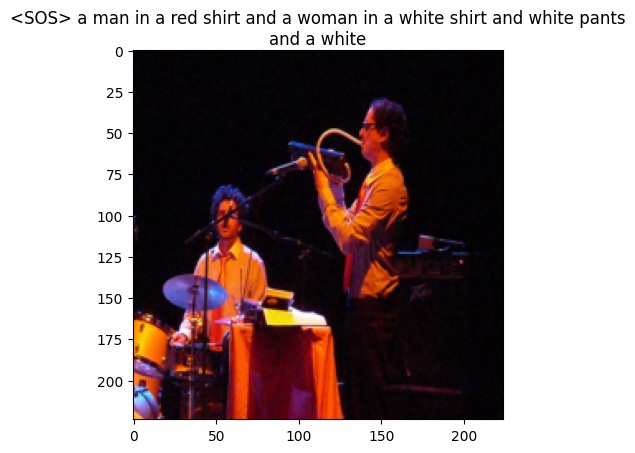

Epoch: 3/10, Step: 600/1265, Loss: 2.84245
Generated Caption: <SOS> a man in a red shirt is standing on a bench . <EOS>


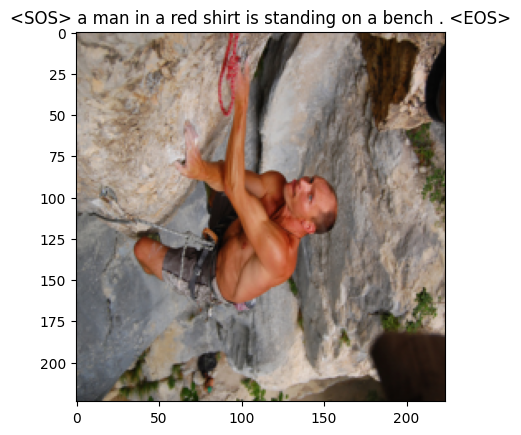

Epoch: 3/10, Step: 800/1265, Loss: 2.62979
Generated Caption: <SOS> a group of people are standing in a race . <EOS>


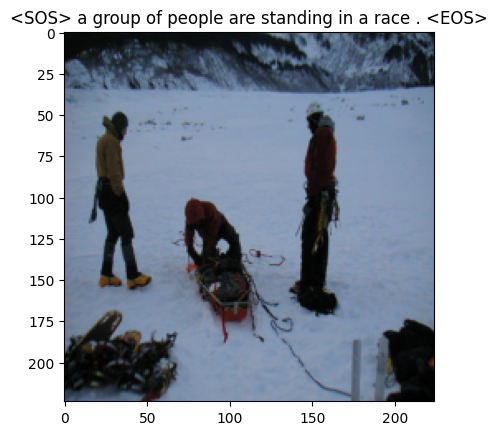

Epoch: 3/10, Step: 1000/1265, Loss: 2.70988
Generated Caption: <SOS> a man in a red shirt and a black hat is standing in front of a crowd . <EOS>


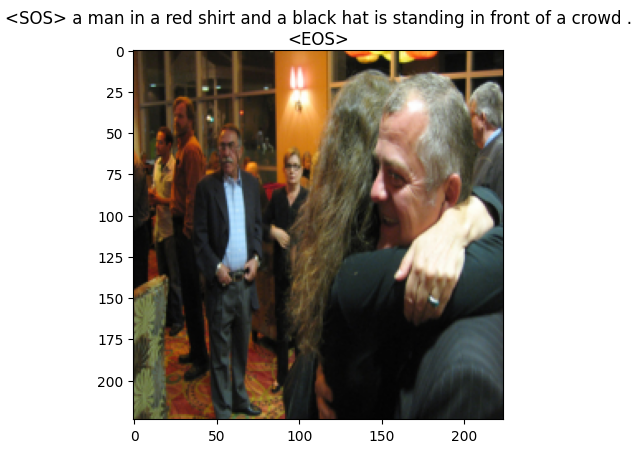

Epoch: 3/10, Step: 1200/1265, Loss: 2.81101
Generated Caption: <SOS> a man in a blue shirt is riding a bicycle on a ramp . <EOS>


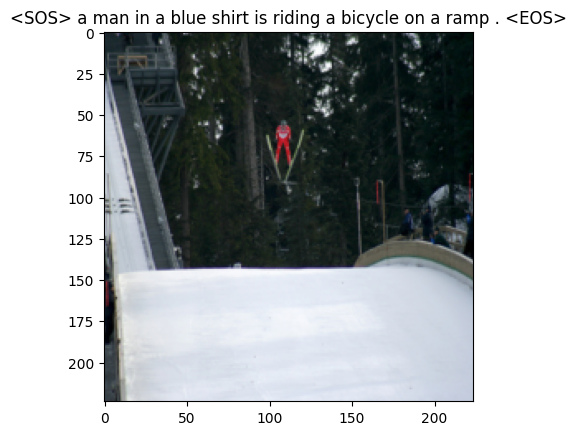

Epoch: 4/10, Step: 200/1265, Loss: 2.67742
Generated Caption: <SOS> a person is riding a bike on a dirt road . <EOS>


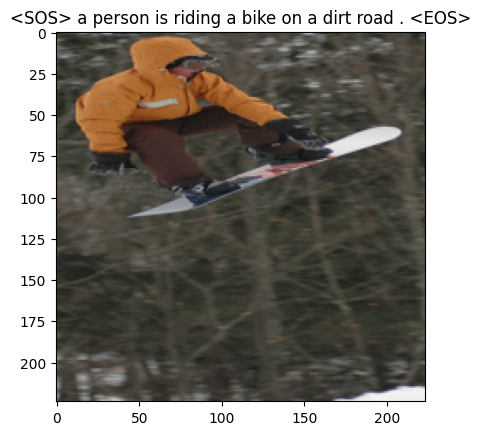

Epoch: 4/10, Step: 400/1265, Loss: 2.68991
Generated Caption: <SOS> a dog is running through a grassy area . <EOS>


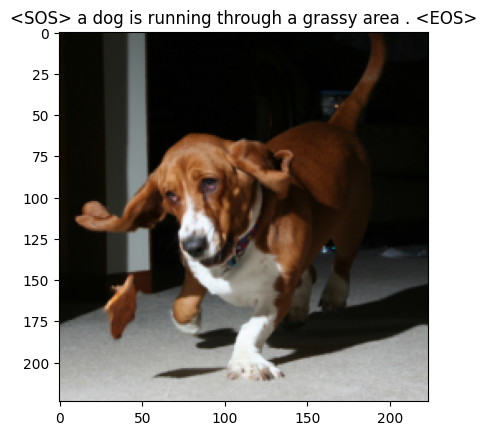

Epoch: 4/10, Step: 600/1265, Loss: 2.52094
Generated Caption: <SOS> a man in a white shirt and a white shirt is standing in front of a crowd . <EOS>


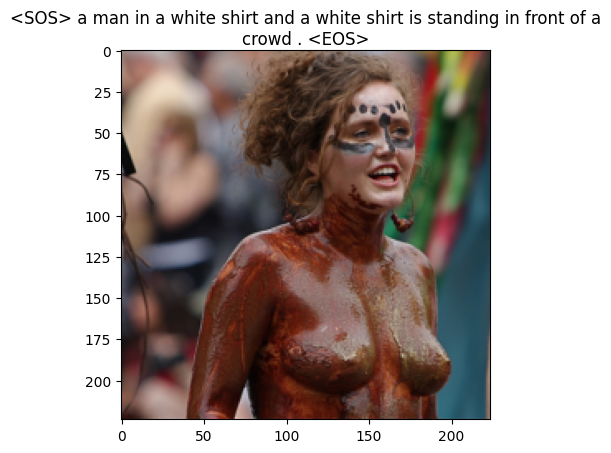

Epoch: 4/10, Step: 800/1265, Loss: 2.58242
Generated Caption: <SOS> a man in a white shirt and a woman in a white shirt and a woman in a white


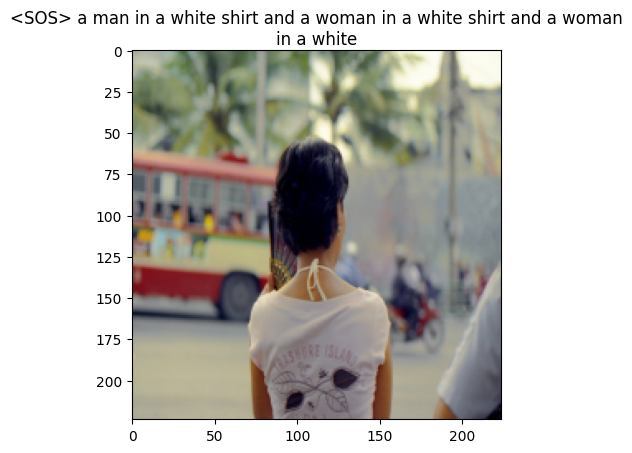

Epoch: 4/10, Step: 1000/1265, Loss: 2.40499
Generated Caption: <SOS> a dog is running through a field . <EOS>


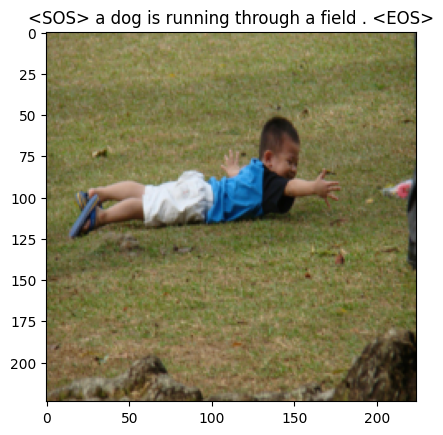

Epoch: 4/10, Step: 1200/1265, Loss: 2.41237
Generated Caption: <SOS> a young boy is jumping into a pool . <EOS>


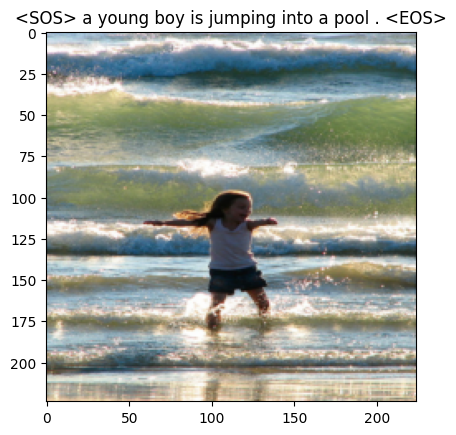

Epoch: 5/10, Step: 200/1265, Loss: 2.34916
Generated Caption: <SOS> a man in a black shirt and a woman in a white shirt and black pants is standing in


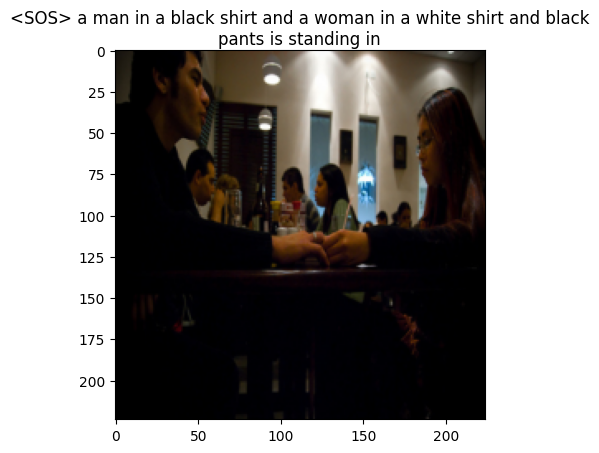

Epoch: 5/10, Step: 400/1265, Loss: 2.32498
Generated Caption: <SOS> a woman in a blue shirt is holding a baby in a crowd . <EOS>


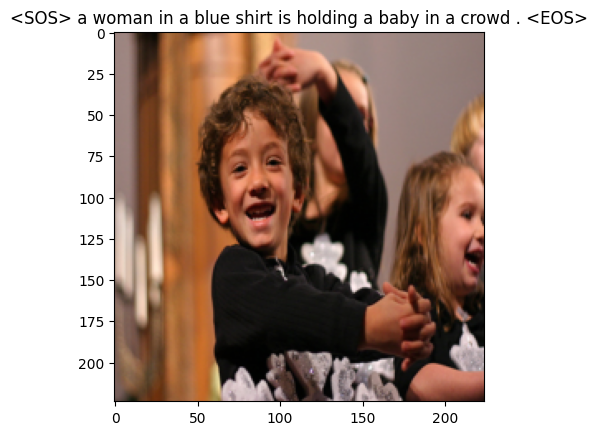

Epoch: 5/10, Step: 600/1265, Loss: 2.39348
Generated Caption: <SOS> a brown dog is running through the grass . <EOS>


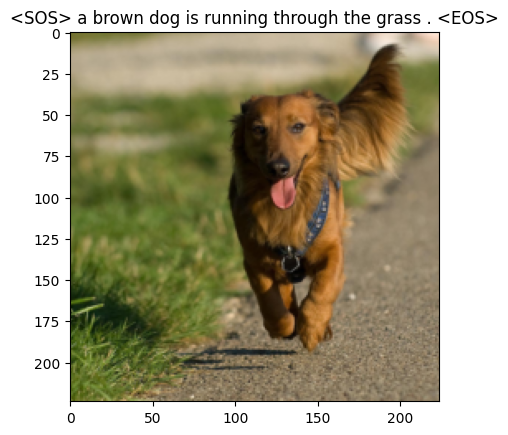

Epoch: 5/10, Step: 800/1265, Loss: 2.20090
Generated Caption: <SOS> a boy in a red shirt is playing a game of <UNK> . <EOS>


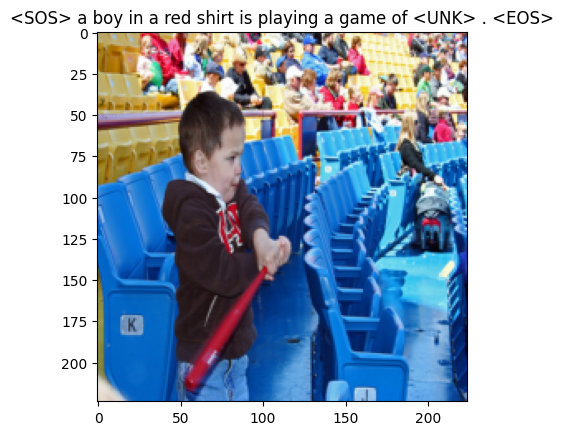

Epoch: 5/10, Step: 1000/1265, Loss: 2.74262
Generated Caption: <SOS> a young boy in a blue shirt is jumping into a pool . <EOS>


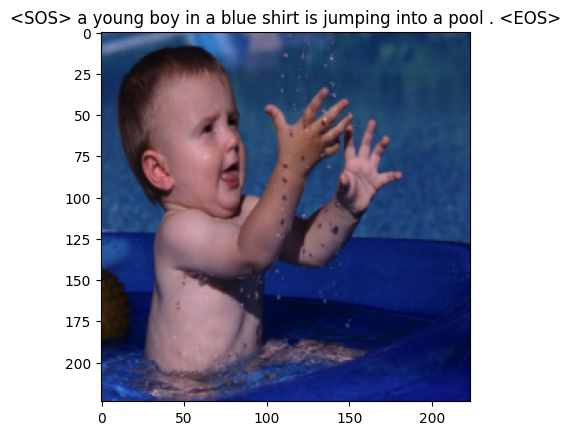

Epoch: 5/10, Step: 1200/1265, Loss: 2.48149
Generated Caption: <SOS> a little girl in a pink dress is playing in a puddle . <EOS>


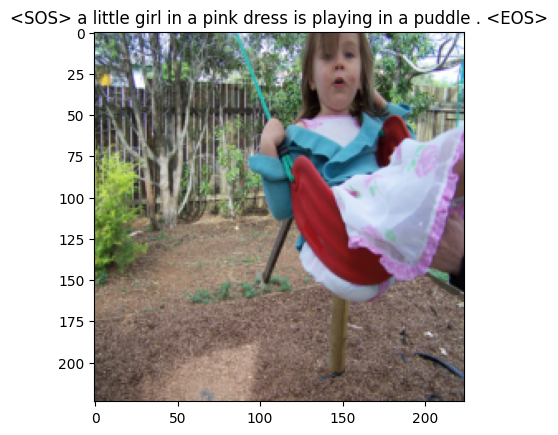

Epoch: 6/10, Step: 200/1265, Loss: 2.28142
Generated Caption: <SOS> a boy in a red shirt is playing in the water . <EOS>


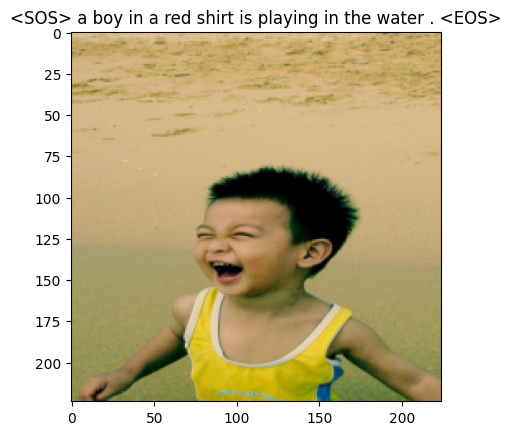

Epoch: 6/10, Step: 400/1265, Loss: 2.30242
Generated Caption: <SOS> a white dog is running on a dirt track . <EOS>


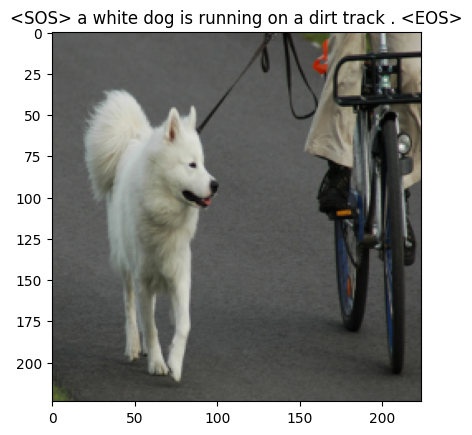

Epoch: 6/10, Step: 600/1265, Loss: 2.35713
Generated Caption: <SOS> a man in a black shirt and a black dog is standing on a dirt path . <EOS>


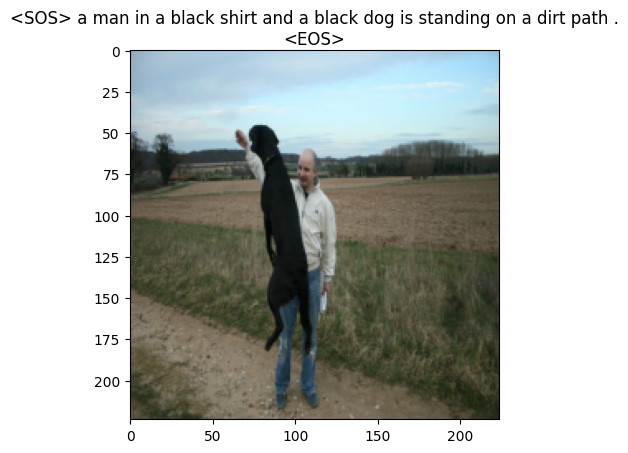

Epoch: 6/10, Step: 800/1265, Loss: 2.32571
Generated Caption: <SOS> a brown dog is running through a field . <EOS>


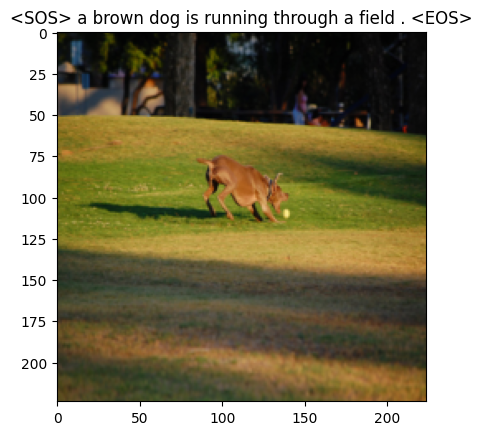

Epoch: 6/10, Step: 1000/1265, Loss: 2.25326
Generated Caption: <SOS> a little girl in a pink dress is playing with a toy . <EOS>


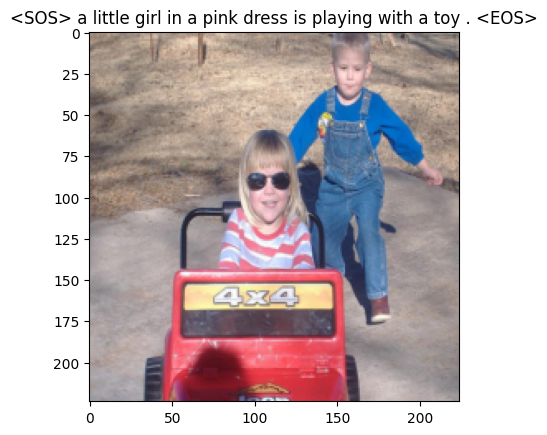

Epoch: 6/10, Step: 1200/1265, Loss: 2.34551
Generated Caption: <SOS> a greyhound racing dog is running on the track . <EOS>


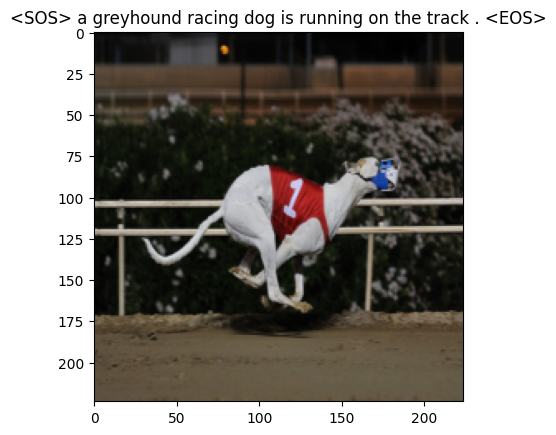

Epoch: 7/10, Step: 200/1265, Loss: 2.15805
Generated Caption: <SOS> a dog is jumping over a hurdle . <EOS>


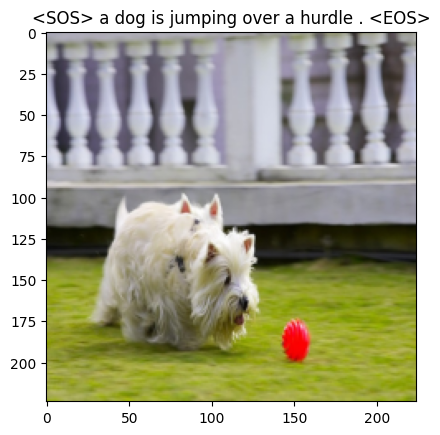

Epoch: 7/10, Step: 400/1265, Loss: 2.23034
Generated Caption: <SOS> a group of people are playing in a fountain . <EOS>


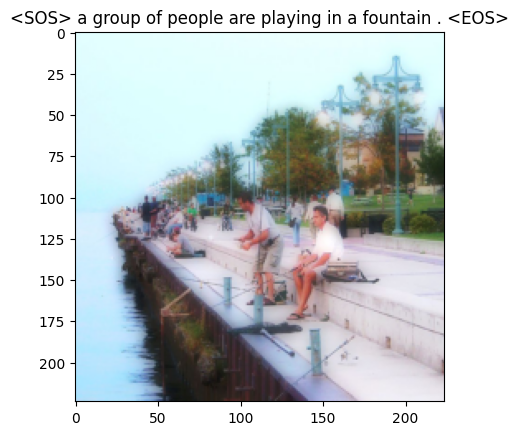

Epoch: 7/10, Step: 600/1265, Loss: 2.23936
Generated Caption: <SOS> a man and a woman sit on a bench . <EOS>


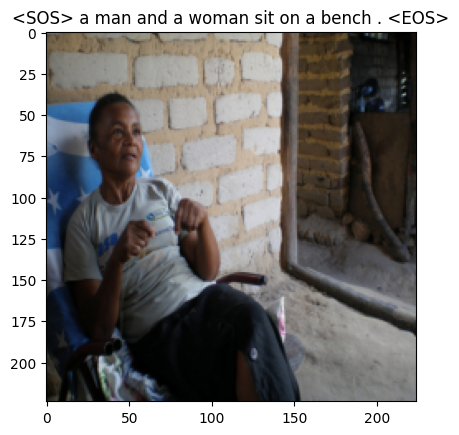

Epoch: 7/10, Step: 800/1265, Loss: 2.08450
Generated Caption: <SOS> a man in a black shirt and a woman in a black shirt are walking down a sidewalk .


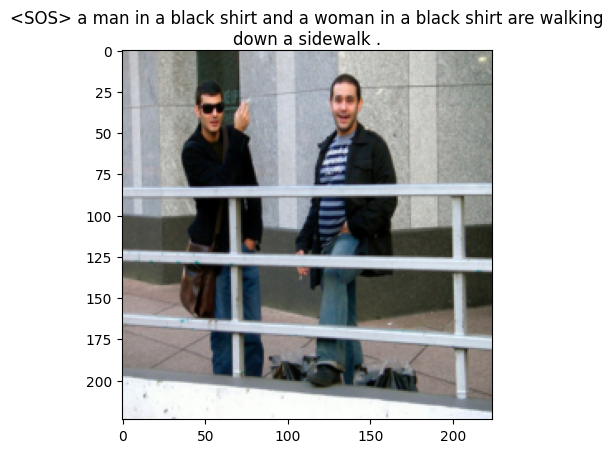

Epoch: 7/10, Step: 1000/1265, Loss: 2.14376
Generated Caption: <SOS> a man and a woman are sitting on a bench and looking at a book . <EOS>


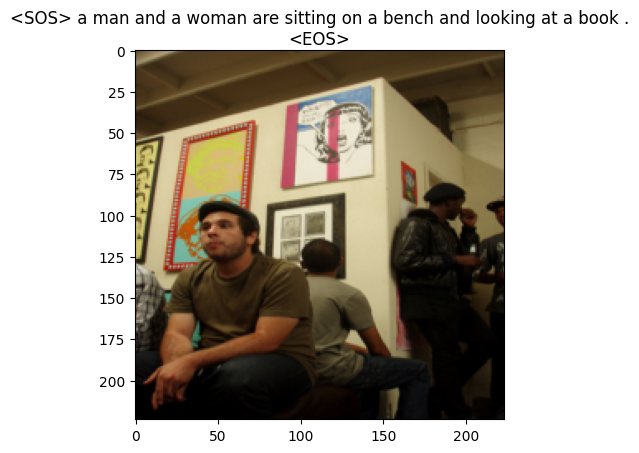

Epoch: 7/10, Step: 1200/1265, Loss: 2.13315
Generated Caption: <SOS> a boy in a red shirt is standing on a tree stump . <EOS>


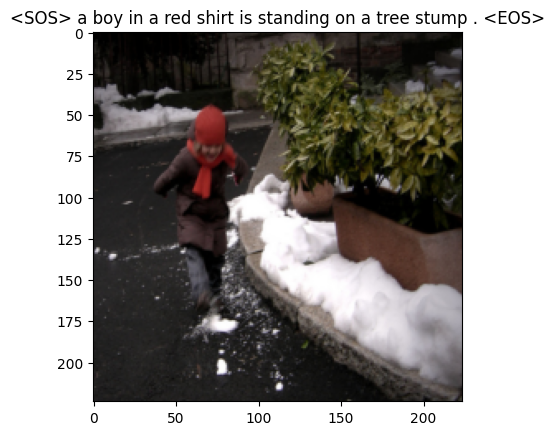

Epoch: 8/10, Step: 200/1265, Loss: 2.07982
Generated Caption: <SOS> a man in a blue shirt is standing on a street with a bicycle in the background . <EOS>


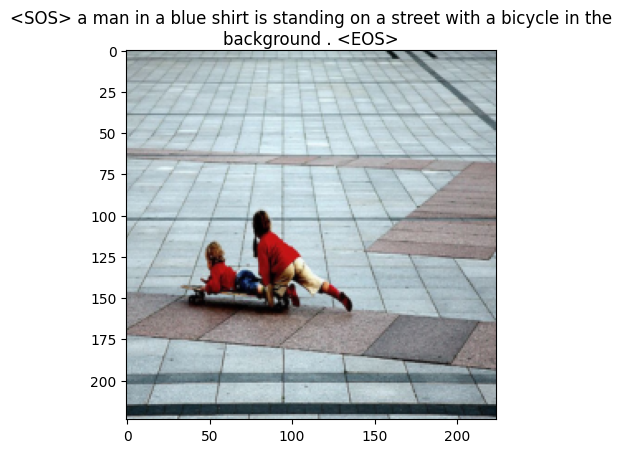

Epoch: 8/10, Step: 400/1265, Loss: 2.03356
Generated Caption: <SOS> a boy in a blue bathing suit is jumping into a pool . <EOS>


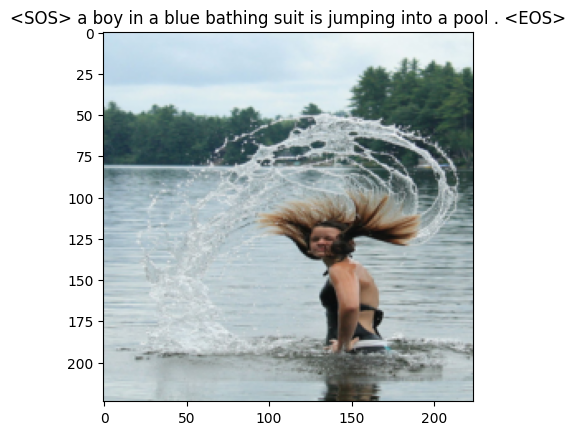

Epoch: 8/10, Step: 600/1265, Loss: 1.96343
Generated Caption: <SOS> a dog is swimming in a pool . <EOS>


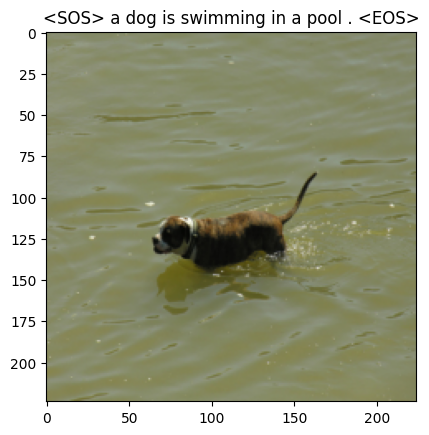

Epoch: 8/10, Step: 800/1265, Loss: 2.11798
Generated Caption: <SOS> a dog is running through the snow . <EOS>


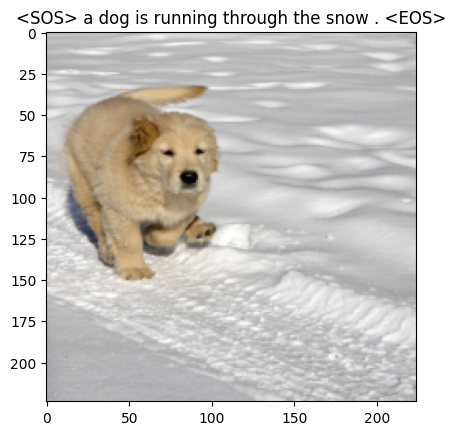

Epoch: 8/10, Step: 1000/1265, Loss: 2.11764
Generated Caption: <SOS> three dogs are running in a field . <EOS>


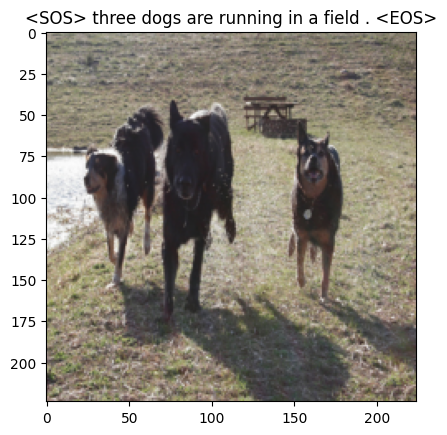

Epoch: 8/10, Step: 1200/1265, Loss: 2.02010
Generated Caption: <SOS> a woman in a brown jacket and a brown dog are playing with a white dog . <EOS>


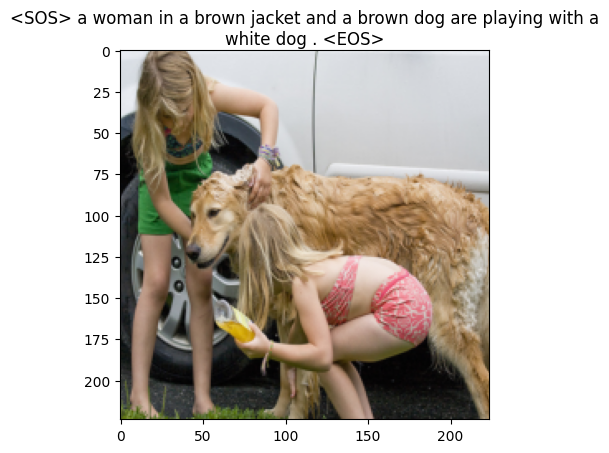

Epoch: 9/10, Step: 200/1265, Loss: 1.98548
Generated Caption: <SOS> a dog is running on the grass . <EOS>


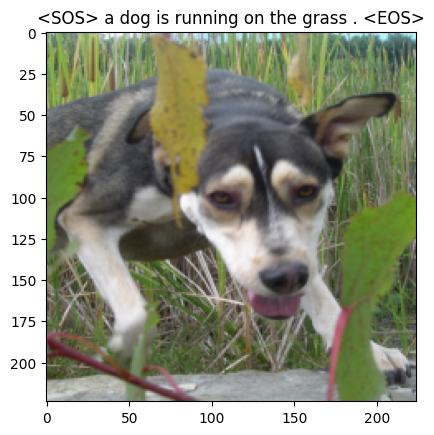

Epoch: 9/10, Step: 400/1265, Loss: 1.82748
Generated Caption: <SOS> a young boy wearing a red shirt is jumping off a swing . <EOS>


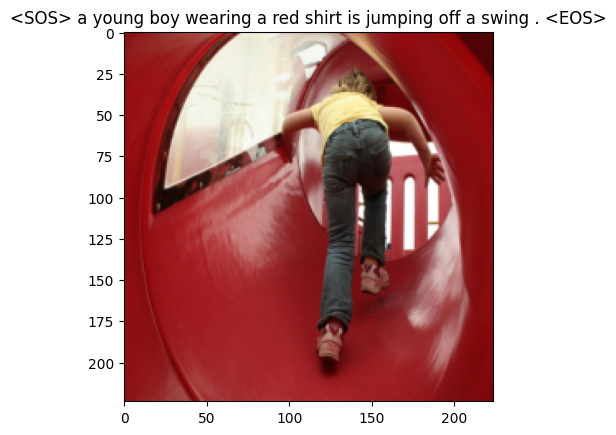

Epoch: 9/10, Step: 600/1265, Loss: 2.05293
Generated Caption: <SOS> two dogs are running through a field . <EOS>


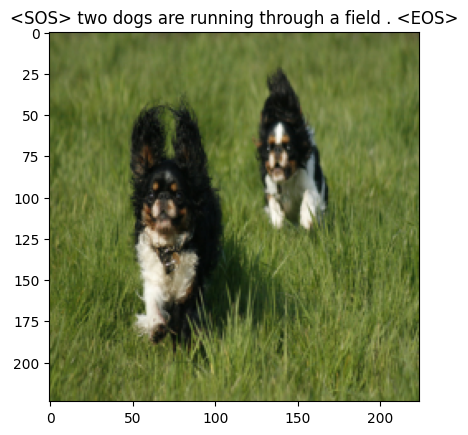

Epoch: 9/10, Step: 800/1265, Loss: 2.10395
Generated Caption: <SOS> a group of young women in <UNK> uniforms are standing in a crowd . <EOS>


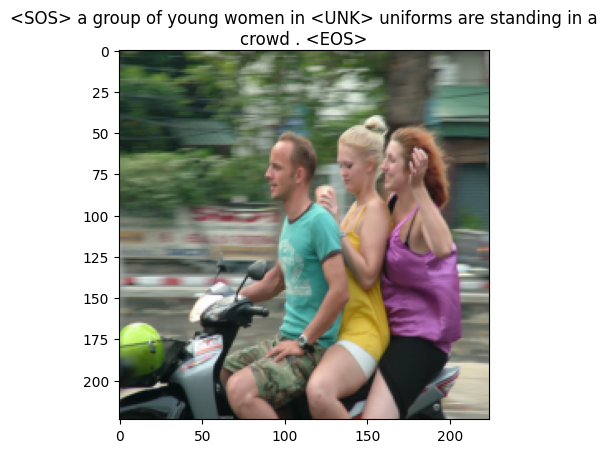

Epoch: 9/10, Step: 1000/1265, Loss: 2.19087
Generated Caption: <SOS> a young girl in a pink dress is swimming in a pool . <EOS>


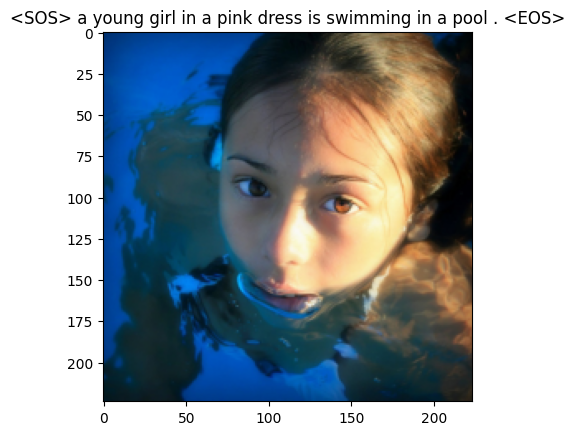

Epoch: 9/10, Step: 1200/1265, Loss: 2.10050
Generated Caption: <SOS> a white dog and a brown dog are playing with a red ball . <EOS>


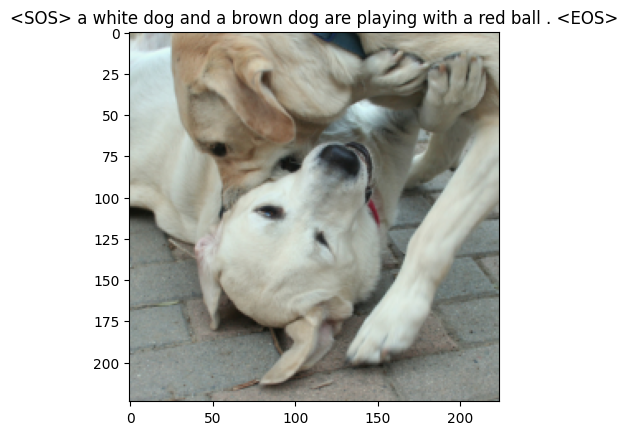

Epoch: 10/10, Step: 200/1265, Loss: 1.97028
Generated Caption: <SOS> a black dog is running through a grassy area . <EOS>


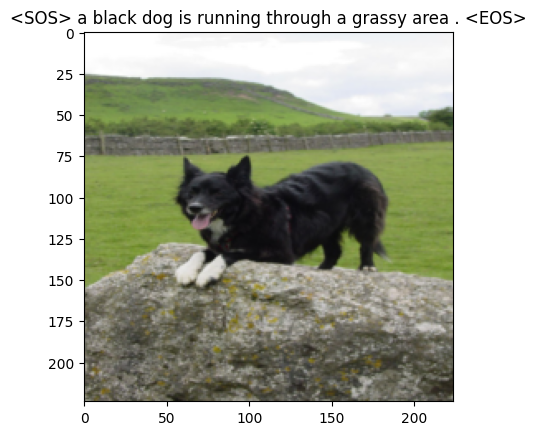

Epoch: 10/10, Step: 400/1265, Loss: 1.84590
Generated Caption: <SOS> a man and a dog are standing on a beach . <EOS>


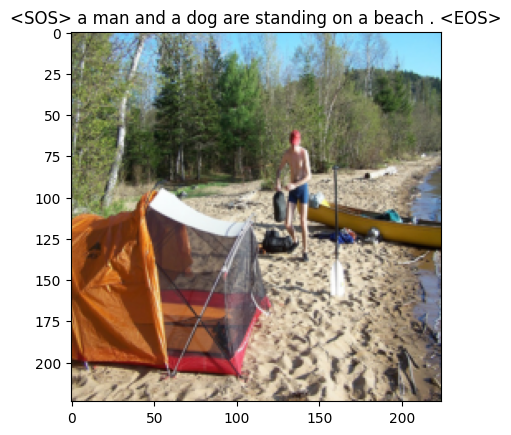

Epoch: 10/10, Step: 600/1265, Loss: 1.96096
Generated Caption: <SOS> a brown dog is running through a <UNK> cut <UNK> <UNK> . <EOS>


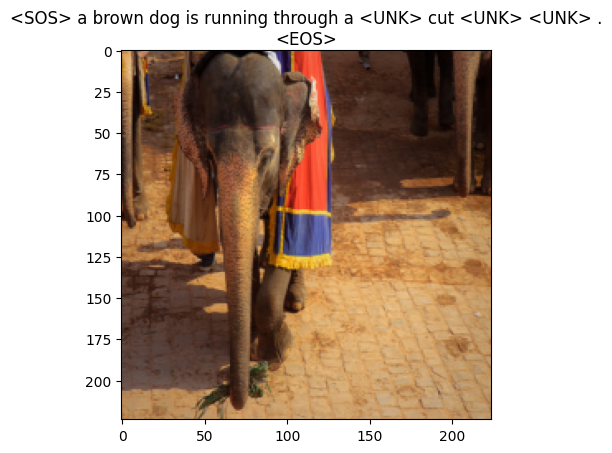

Epoch: 10/10, Step: 800/1265, Loss: 2.05782
Generated Caption: <SOS> two girls in a park with a tree . <EOS>


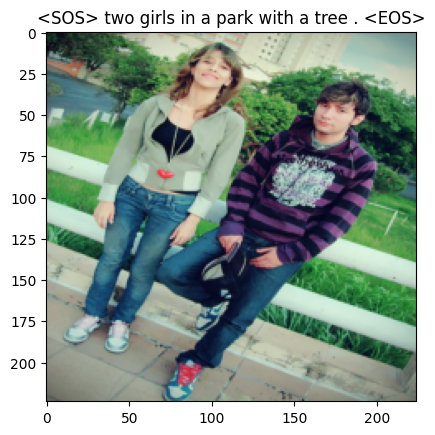

Epoch: 10/10, Step: 1000/1265, Loss: 1.95012
Generated Caption: <SOS> four people are in a canoe on a river . <EOS>


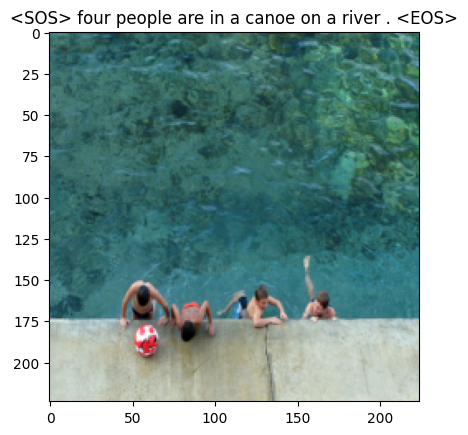

Epoch: 10/10, Step: 1200/1265, Loss: 1.87934
Generated Caption: <SOS> a young girl in a pink shirt and blue jeans is jumping off a swing . <EOS>


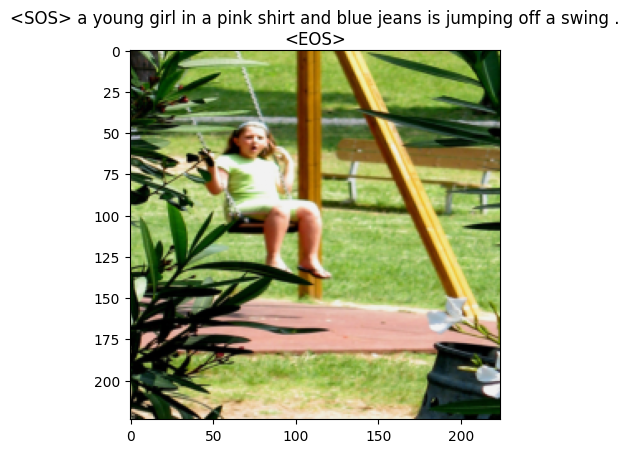

Training completed.


In [ ]:
# ==============================================================================
# 7. TRAINING SETUP AND EXECUTION
# ==============================================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on device: {device}")

# Hyperparameters
embed_size = 300
hidden_size = 512
vocab_size = len(dataset.vocab)
num_layers = 2
learning_rate = 3e-4 # Common starting learning rate
num_epochs = 10     # A reasonable number of epochs for initial training

# Initialize model, loss, etc.
model = EncoderDecoder(embed_size, hidden_size, vocab_size, num_layers).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

print("Starting training...")

# Utility function to show image
def show_image(inp, title=None):
    """Imshow for Tensor"""
    inp = inp.cpu().numpy().transpose((1,2,0))
    # Un-normalize if necessary (assuming standard normalization)
    # mean = np.array([0.485, 0.456, 0.406])
    # std = np.array([0.229, 0.224, 0.225])
    # inp = std * inp + mean
    # inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title, wrap=True)
    plt.pause(0.001)


# Training loop
for epoch in range(1, num_epochs + 1):
    for idx, batch_data in enumerate(data_loader):
        if batch_data[0] is None:
            continue # Skip batch if it's empty due to file errors

        image, captions = batch_data
        image, captions = image.to(device), captions.to(device)

        # Zero the gradients
        optimizer.zero_grad()

        # Feed forward
        outputs = model(image, captions)

        # Calculate the batch loss
        loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))

        # Backward pass
        loss.backward()

        # Update the parameters
        optimizer.step()

        # Print progress and generate a sample caption
        if (idx + 1) % 200 == 0:
            print(f"Epoch: {epoch}/{num_epochs}, Step: {idx+1}/{len(data_loader)}, Loss: {loss.item():.5f}")

            # Generate a caption for a sample image
            model.eval()
            with torch.no_grad():
                # Use a sample from the current batch for evaluation
                sample_img_tensor = image[0:1] # Take the first image of the batch

                features = model.encoder(sample_img_tensor)
                caps = model.decoder.generate_caption(features.unsqueeze(1), vocab=dataset.vocab)
                caption = ' '.join(caps)

                print(f"Generated Caption: {caption}")
                show_image(sample_img_tensor.squeeze(0), title=caption)
                plt.show()
            model.train()

print("Training completed.")


In [ ]:
# ==============================================================================
# 8. SAVE THE TRAINED MODEL TO GOOGLE DRIVE
# ==============================================================================

print("\nSaving the trained model to Google Drive...")

# Define the full path where the model will be saved
model_save_path = '/content/drive/MyDrive/Multimodal-Media-Retrieval-Captioning/trained_pytorch-rsnet-ltsm'
# This uses the base path of your project on Google Drive that we defined earlier
model_save_path = os.path.join(model_save_path, 'resnet_lstm_model.pth')

# Save the model's state dictionary
torch.save(model.state_dict(), model_save_path)

print(f"Model successfully saved to: {model_save_path}")


Saving the trained model to Google Drive...
Model successfully saved to: /content/drive/MyDrive/Multimodal-Media-Retrieval-Captioning/trained_pytorch-rsnet-ltsm/resnet_lstm_model.pth
